IMPORTS

In [1]:
import torch
import numpy as np
import pandas as pd
import os

import librosa
import parselmouth
from scipy.stats import skew, kurtosis
from tqdm import tqdm
import json
import csv

from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
import math

import shap
from lime.lime_tabular import LimeTabularExplainer
from captum.attr import IntegratedGradients
from shap.plots._waterfall import waterfall_legacy

import re

import tensorflow as tf
import keras
from keras import layers

from scipy.interpolate import interp1d

from lime import lime_tabular

from tqdm import tqdm

CARGA DE DATASET

In [2]:
raiz = os.getcwd()
raiz = raiz.removesuffix("\\Modelos\\Iván") # Cambiar la ruta para que sea .../tfg-2526-xplicavoz/Dataset/todosLosAudiosMezcladosyDivididos
ruta = os.path.join(raiz,"Dataset\\todosLosAudiosMezcladosyDivididos")
ruta

'c:\\Users\\ivire\\Documents\\GitHub\\TFG\\tfg-2526-xplicavoz\\Dataset\\todosLosAudiosMezcladosyDivididos'

Dataframe de la salida del modelo wav2vec2 para el dataframe de prueba

In [3]:
out_dataset = pd.read_csv(os.path.join(ruta,"out.csv"))
out_dataset["label"] = out_dataset["label_real"]
out_dataset.drop(columns="label_real")
ruta = ruta.removesuffix("\\out.csv")

Dataframe de entrada para las pruebas del wav2vec2

In [4]:
test_dataset = pd.read_csv(os.path.join(ruta,"test.csv"))
test_dataset["audio_id"] = out_dataset["audio_id"]
ruta = ruta.removesuffix("\\test.csv")

In [5]:
print(ruta)

c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-xplicavoz\Dataset\todosLosAudiosMezcladosyDivididos


In [8]:
datos = pd.merge(test_dataset[["path","label","audio_id"]],out_dataset[["score","audio_id"]],how="inner", on = "audio_id")
datos

,path,label,audio_id,score
0,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,0,I_32_N,0.340131
1,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,1,E_47_G,0.773167
2,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,0,I_12_N,0.290588
3,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,0,I_3_N,0.767834
4,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,1,E_7_G,0.772510
5,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,1,I_2_G,0.664930
6,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,0,E_11_N,0.300437
7,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,0,E_23_N,0.267054
8,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,1,E_16_G,0.779213
9,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,1,I_6_G,0.761631


EXTRAER CARACTERÍSTICAS DE LOS AUDIOS DEL CONJUNTO

In [9]:
def extract_pitch(audio, sr):
    f0, voiced_flag, voiced_prob = librosa.pyin(
            y=audio, 
            fmin=librosa.note_to_hz('C2'),
            fmax=librosa.note_to_hz('C7'),
            sr=sr
        )

    f0_sonoro = f0[voiced_flag]
    
    if len(f0_sonoro) == 0:
        return None  # No hay pitch detectable

    return f0_sonoro

def extract_formants(path):
    snd = parselmouth.Sound(path)
    formant = snd.to_formant_burg()
    f1, f2, f3 = [], [], []
    for t in np.linspace(0, snd.duration, 100):
        try:
            f1.append(formant.get_value_at_time(1, t))
            f2.append(formant.get_value_at_time(2, t))
            f3.append(formant.get_value_at_time(3, t))
        except:
            pass
    return f1, f2, f3

def extract_silence(audio, sr, threshold=0.02):
    energy = librosa.feature.rms(y=audio)[0]
    silence_ratio = np.mean(energy < threshold)
    return silence_ratio

def extract_hnr(path):
    snd = parselmouth.Sound(path)
    hnr = snd.to_harmonicity()
    return np.mean(hnr.values[hnr.values != -200])

In [10]:
def extract_features(path):
    try:
        audio, sr = librosa.load(path, sr=None)
        duration = librosa.get_duration(y=audio, sr=sr)
        
        rms = np.mean(librosa.feature.rms(y=audio))
        zcr = np.mean(librosa.feature.zero_crossing_rate(y=audio))
        centroid = np.mean(librosa.feature.spectral_centroid(y=audio, sr=sr))
        bandwidth = np.mean(librosa.feature.spectral_bandwidth(y=audio, sr=sr))
        rolloff = np.mean(librosa.feature.spectral_rolloff(y=audio, sr=sr))
        flatness = np.mean(librosa.feature.spectral_flatness(y=audio))
        
        mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)

        pitch = extract_pitch(audio, sr)
        pitch_mean = np.nanmean(pitch)
        pitch_std = np.nanstd(pitch)
        
        f1, f2, f3 = extract_formants(path)
        f1_mean = np.nanmean(f1)
        f2_mean = np.nanmean(f2)
        f3_mean = np.nanmean(f3)
        
        hnr = extract_hnr(path)
        silence = extract_silence(audio, sr)
        
        features = {
            "filename": path,
            "duration": duration,
            "rms": rms,
            "zcr": zcr,
            "spectral_centroid": centroid,
            "spectral_bandwidth": bandwidth,
            "spectral_rolloff": rolloff,
            "spectral_flatness": flatness,
            "pitch": pitch,
            "pitch_mean": pitch_mean,
            "pitch_std": pitch_std,
            "f1": f1,
            "f2": f2,
            "f3": f3,
            "f1_mean": f1_mean,
            "f2_mean": f2_mean,
            "f3_mean": f3_mean,
            "hnr": hnr,
            "silence_ratio": silence,
        }

        for i, val in enumerate(mfcc):
            features[f"mfcc_{i+1}"] = val
            features[f"mfcc_{i+1}_mean"] = np.nanmean(val)
        
        # Estadísticos globales
        features["skewness"] = skew(audio)
        features["kurtosis"] = kurtosis(audio)
        
        return features
    except Exception as e:
        print(f"Error procesando {path}: {e}")
        return None

In [11]:
def features(files):
    features_list = []
    for file in tqdm(files, desc="Extrayendo características"):
        feats = extract_features(file)
        if feats:
            features_list.append(feats)
    return features_list

In [12]:
audios_con_caracteristicas = pd.DataFrame(features(datos["path"]))

Extrayendo características:   0%|          | 0/20 [00:00<?, ?it/s]

Extrayendo características: 100%|██████████| 20/20 [00:40<00:00,  2.00s/it]


In [13]:
audios_con_caracteristicas['pitch'] = audios_con_caracteristicas['pitch'].apply(lambda x: json.dumps(x.tolist()))
audios_con_caracteristicas['f1'] = audios_con_caracteristicas['f1'].apply(lambda x: json.dumps(x))
audios_con_caracteristicas['f2'] = audios_con_caracteristicas['f2'].apply(lambda x: json.dumps(x))
audios_con_caracteristicas['f3'] = audios_con_caracteristicas['f3'].apply(lambda x: json.dumps(x))
for col in audios_con_caracteristicas.columns:
    if 'mfcc' in col and not col.endswith('mean'):
        audios_con_caracteristicas[col] = audios_con_caracteristicas[col].apply(lambda x: json.dumps(x.tolist()))

In [14]:
audios_con_caracteristicas["score"] = datos["score"]

SURROGATE MODEL

##### S1 - ENERGÍA

Características: rms, silence_ratio, zcr, skewness, kurtosis.

Explica si el modelo detecta deepfakes por dinámica de energía.

In [15]:
# features
X_energia = audios_con_caracteristicas[["rms","zcr","silence_ratio","skewness","kurtosis"]]

# salida del modelo wav2vec2
y = audios_con_caracteristicas["score"]

# modelo
model1 = Ridge()

# entrenamiento
model1.fit(X_energia, y)

# predicción
salida1 = model1.predict(X_energia)
print(salida1)

# coeficientes
print(model1.coef_)

[0.54762361 0.58332415 0.52822813 0.52634483 0.5837344  0.55295008
 0.58496229 0.58503196 0.56853294 0.56379449 0.56673789 0.56776642
 0.58713764 0.57471707 0.58668683 0.58713135 0.59220167 0.58665977
 0.56802266 0.58993559]
[ 0.00271066  0.01905128 -0.02244987  0.00270596 -0.00184987]


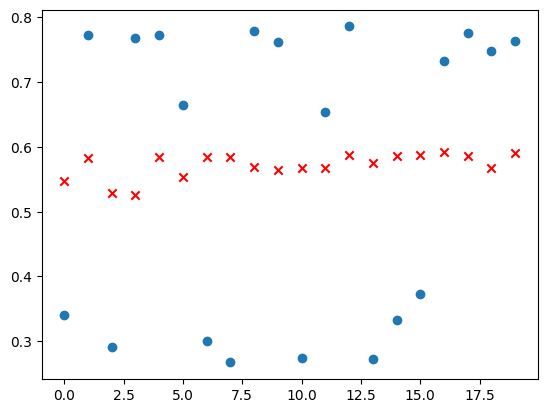

In [16]:
# Datos
x = list(range(datos["label"].size))
y_real = datos["score"]
y_modelo = salida1

# Crear gráfica
plt.scatter(x,y_modelo, label = "PREDICHO", marker='x', color = 'red' )
plt.scatter(x, y_real, label = "REAL")
# Mostrar

plt.show()

##### S2 - ESPECTRALES

Características: spectral centroid, spectral bandwidth, spectral rolloff, spectral flatness, hnr

Este modelo analiza distribución de energía en frecuencia.

In [17]:
# features
X_espectrales = audios_con_caracteristicas[["spectral_centroid","spectral_bandwidth","spectral_rolloff","spectral_flatness","hnr"]]

# salida del modelo wav2vec2
y = audios_con_caracteristicas["score"]

# modelo
model2 = Ridge()

# entrenamiento
model2.fit(X_espectrales, y)

# predicción
salida2 = model2.predict(X_espectrales)
print(salida2)

# coeficientes
print(model2.coef_)

[0.50097088 0.65696112 0.49076223 0.40679672 0.69107134 0.73568764
 0.59565402 0.27401671 0.79352101 0.63014448 0.36469564 0.72901775
 0.78425776 0.37662821 0.31879167 0.36928187 0.63389074 0.58423696
 0.67951455 0.81562247]
[ 0.00142103 -0.00124092 -0.00056382  0.04336962 -0.01349693]


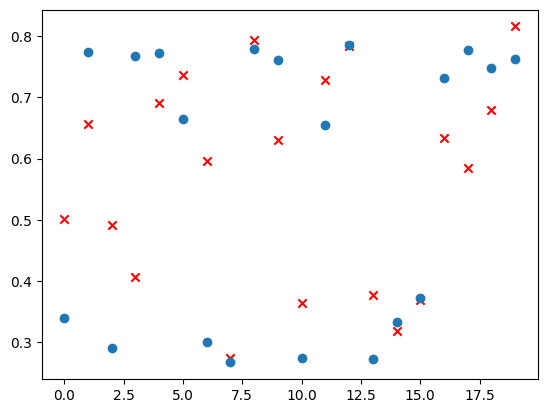

In [18]:
# Datos
x = list(range(datos["label"].size))
y_real = datos["score"]
y_modelo = salida2

# Crear gráfica
plt.scatter(x,y_modelo, label = "PREDICHO", marker='x', color = 'red' )
plt.scatter(x, y_real, label = "REAL")
# Mostrar

plt.show()

##### S3 - PITCH

Características: pitch_mean, pitch_std

Este explica estabilidad del pitch, algo importante en voces sintéticas.

In [19]:
# features
X_pitch = audios_con_caracteristicas[["pitch_mean","pitch_std"]]

# salida del modelo wav2vec2
y = audios_con_caracteristicas["score"]

# modelo
model3 = Ridge()

# entrenamiento
model3.fit(X_pitch, y)

# predicción
salida3 = model3.predict(X_pitch)
print(salida3)

# coeficientes
print(model3.coef_)

[0.37863259 0.56421671 0.48127619 0.56473888 0.66080825 0.56663412
 0.58424809 0.67302816 0.62437022 0.50998023 0.5037078  0.53988072
 0.62226021 0.59356857 0.60277156 0.5182961  0.6950127  0.56741176
 0.5589515  0.62172942]
[ 0.00036681 -0.00619179]


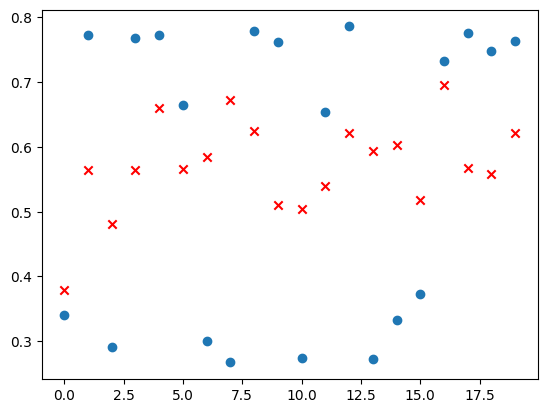

In [20]:
# Datos
x = list(range(datos["label"].size))
y_real = datos["score"]
y_modelo = salida3

# Crear gráfica
plt.scatter(x,y_modelo, label = "PREDICHO", marker='x', color = 'red' )
plt.scatter(x, y_real, label = "REAL")
# Mostrar

plt.show()

##### S4 - FORMANTES

Características: f1_mean, f2_mean, f3_mean

Los formantes describen la estructura vocal.

In [21]:
# features
X_formants = audios_con_caracteristicas[["f1_mean","f2_mean","f3_mean"]]

# salida del modelo wav2vec2
y = audios_con_caracteristicas["score"]

# modelo
model4 = Ridge()

# entrenamiento
model4.fit(X_formants, y)

# predicción
salida4 = model4.predict(X_formants)
print(salida4)

# coeficientes
print(model4.coef_)

[0.39154192 0.81126921 0.57039045 0.43650966 0.57106893 0.71810189
 0.43079692 0.38652377 0.51983727 0.67130427 0.59741845 0.67600999
 0.6140734  0.42654258 0.53861711 0.4167702  0.61282865 0.74107165
 0.49833817 0.80250927]
[-1.33828943e-03 -7.49871847e-05  1.32120771e-03]


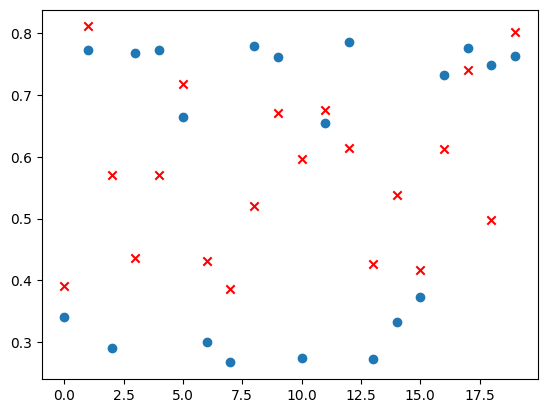

In [22]:
# Datos
x = list(range(datos["label"].size))
y_real = datos["score"]
y_modelo = salida4

# Crear gráfica
plt.scatter(x,y_modelo, label = "PREDICHO", marker='x', color = 'red' )
plt.scatter(x, y_real, label = "REAL")
# Mostrar

plt.show()

##### S5 - MFCC

Características: mfcc1_mean, mfcc2_mean,  mfcc3_mean, mfcc4_mean,  mfcc5_mean, mfcc6_mean,  mfcc7_mean, mfcc8_mean,  mfcc9_mean, mfcc10_mean,  mfcc11_mean, mfcc12_mean,  mfcc13_mean

Estos capturan estructura espectral compleja.

In [23]:
# features
X_mfccs = audios_con_caracteristicas[["mfcc_1_mean","mfcc_2_mean","mfcc_3_mean","mfcc_4_mean","mfcc_5_mean","mfcc_6_mean","mfcc_7_mean","mfcc_8_mean","mfcc_9_mean","mfcc_10_mean","mfcc_11_mean","mfcc_12_mean","mfcc_13_mean"]]

# salida del modelo wav2vec2
y = audios_con_caracteristicas["score"]

# modelo
model5 = Ridge()

# entrenamiento
model5.fit(X_mfccs, y)

# predicción
salida5 = model5.predict(X_mfccs)
print(salida5)

# coeficientes
print(model5.coef_)

[0.52893984 0.90038764 0.29669118 0.76469487 0.70893574 0.7432166
 0.37512153 0.22274822 0.6371647  0.7436849  0.3272689  0.5318366
 0.7478027  0.30128175 0.39893925 0.34432948 0.73937464 0.6537061
 0.64001024 0.82538843]
[-0.00029806 -0.00785351 -0.00860744 -0.00543377  0.03044995  0.02646483
 -0.01592382 -0.01553481 -0.01868352  0.00723845 -0.02550367  0.00467266
 -0.00661401]


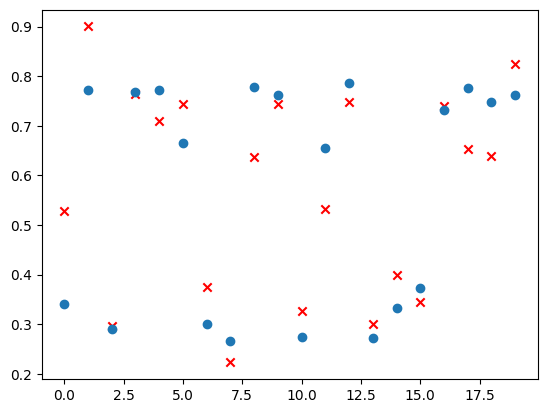

In [24]:
# Datos
x = list(range(datos["label"].size))
y_real = datos["score"]
y_modelo = salida5

# Crear gráfica
plt.scatter(x,y_modelo, label = "PREDICHO", marker='x', color = 'red' )
plt.scatter(x, y_real, label = "REAL")
# Mostrar

plt.show()

XAI aplicada a los SURROGATE MODELS

In [ ]:
instancia_a_explicar = 2 # I_12_N

Usa X_energia, X_espectrales, X_formants, X_mfccs y X_pitch para ver los valores de las características de esa instancia

Para ver todas en conjuntod use audios_con_caracteristicas

In [94]:
audios_con_caracteristicas.loc[instancia_a_explicar]

filename              c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...
duration                                                       2.264813
rms                                                            0.019565
zcr                                                            0.097704
spectral_centroid                                           1636.524177
spectral_bandwidth                                          1590.950084
spectral_rolloff                                            2916.263204
spectral_flatness                                              0.034622
pitch                 [216.22053167995523, 212.505992363466, 213.737...
pitch_mean                                                   266.192884
pitch_std                                                     55.340924
f1                    [NaN, NaN, 1653.8257725097658, 508.54603059143...
f2                    [NaN, NaN, 3022.5887595165527, 2469.5970594110...
f3                    [NaN, NaN, 4205.752798573387, 2952.8971840

In [27]:
audios_con_caracteristicas["score"].loc[instancia_a_explicar]

0.2905878865226391

SURROGATE MODEL 1

SHAP

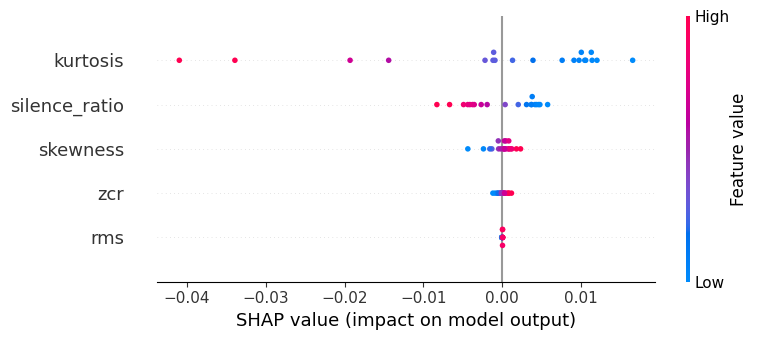

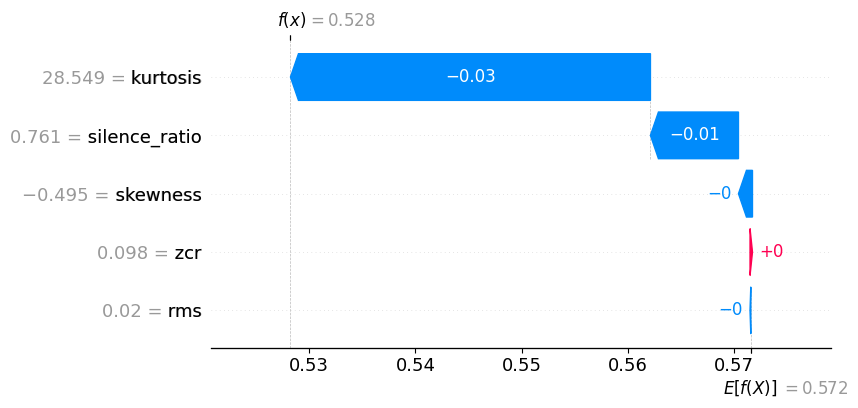

In [28]:
# crear el explainer
explainer_shap1 = shap.Explainer(model1.predict, X_energia)

# calcular SHAP values para todas las muestras
shap_values1 = explainer_shap1(X_energia)

# resumen global
shap.summary_plot(shap_values1, X_energia)

# explicación de la primera muestra
shap.plots.waterfall(shap_values1[instancia_a_explicar])

LIME

In [29]:
explainer_lime1 = LimeTabularExplainer(
    X_energia.values,
    feature_names = X_energia.columns,
    mode = "regression"
)

exp_lime = explainer_lime1.explain_instance(
    X_energia.iloc[instancia_a_explicar].values,
    model1.predict
)

exp_lime.show_in_notebook()

X does not have valid feature names, but Ridge was fitted with feature names


SURROGATE MODEL 2

SHAP

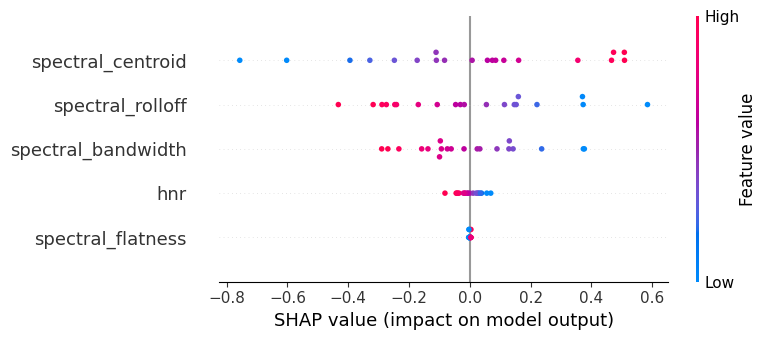

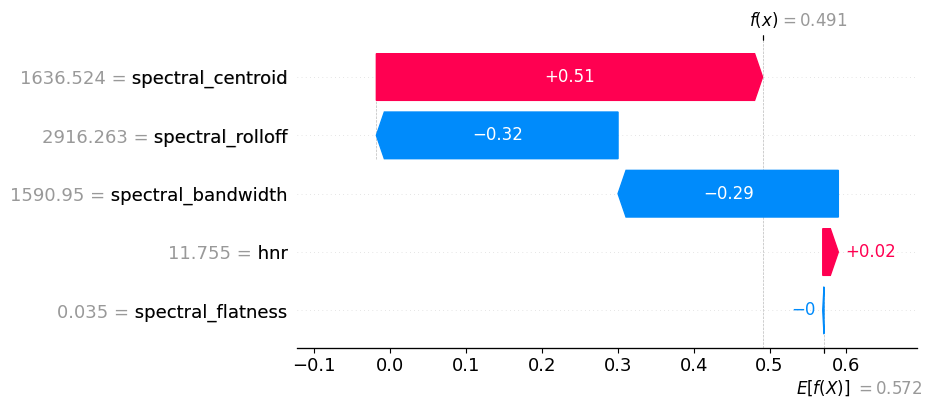

In [30]:
# crear el explainer
explainer_shap2 = shap.Explainer(model2.predict, X_espectrales)

# calcular SHAP values para todas las muestras
shap_values2 = explainer_shap2(X_espectrales)

# resumen global
shap.summary_plot(shap_values2, X_espectrales)

# explicación de la primera muestra
shap.plots.waterfall(shap_values2[instancia_a_explicar])

LIME

In [31]:
explainer_lime2 = LimeTabularExplainer(
    X_espectrales.values,
    feature_names = X_espectrales.columns,
    mode = "regression"
)

exp_lime = explainer_lime2.explain_instance(
    X_espectrales.iloc[instancia_a_explicar].values,
    model2.predict
)

exp_lime.show_in_notebook()

X does not have valid feature names, but Ridge was fitted with feature names


SURROGATE MODEL 3

SHAP

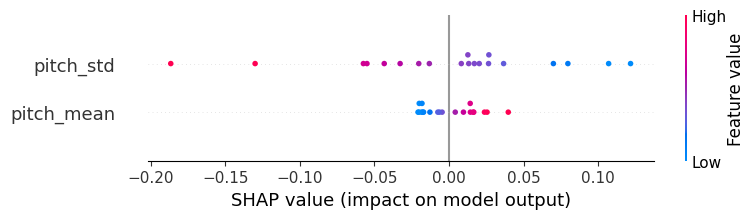

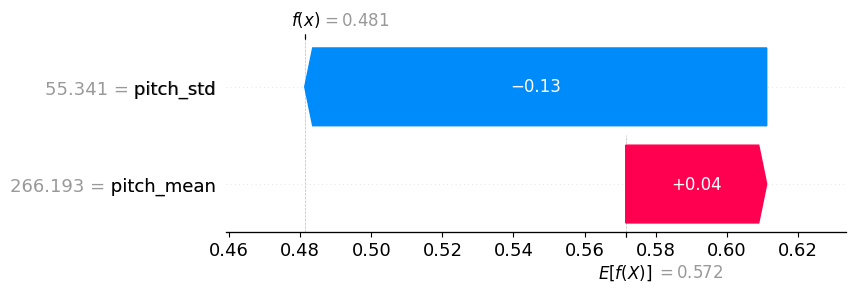

In [32]:
# crear el explainer
explainer_shap3 = shap.Explainer(model3.predict, X_pitch)

# calcular SHAP values para todas las muestras
shap_values3 = explainer_shap3(X_pitch)

# resumen global
shap.summary_plot(shap_values3, X_pitch)

# explicación de la primera muestra
shap.plots.waterfall(shap_values3[instancia_a_explicar])

LIME

In [33]:
explainer_lime3 = LimeTabularExplainer(
    X_pitch.values,
    feature_names = X_pitch.columns,
    mode = "regression"
)

exp_lime = explainer_lime3.explain_instance(
    X_pitch.iloc[instancia_a_explicar].values,
    model3.predict
)

exp_lime.show_in_notebook()

X does not have valid feature names, but Ridge was fitted with feature names


SURROGATE MODEL 4

SHAP

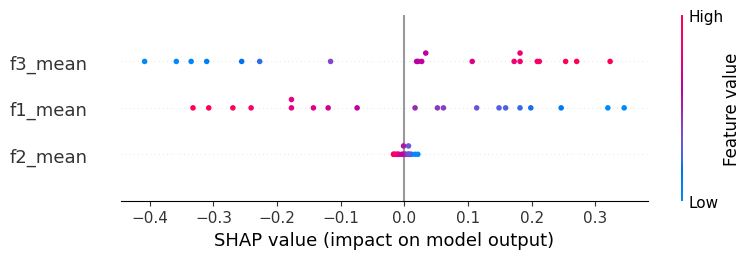

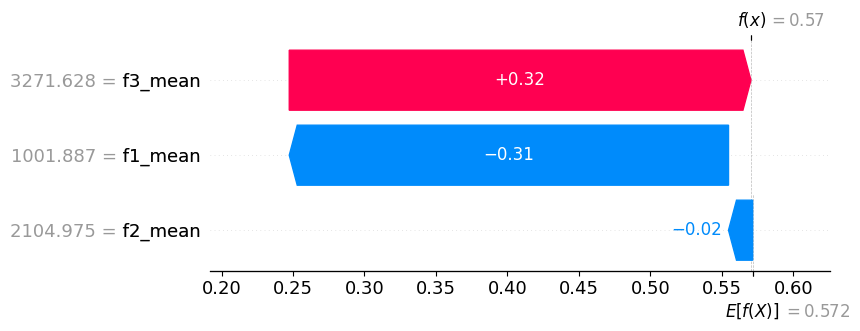

In [34]:
# crear el explainer
explainer_shap4 = shap.Explainer(model4.predict, X_formants)

# calcular SHAP values para todas las muestras
shap_values4 = explainer_shap4(X_formants)

# resumen global
shap.summary_plot(shap_values4, X_formants)

# explicación de la primera muestra
shap.plots.waterfall(shap_values4[instancia_a_explicar])

LIME

In [35]:
explainer_lime4 = LimeTabularExplainer(
    X_formants.values,
    feature_names = X_formants.columns,
    mode = "regression"
)

exp_lime = explainer_lime4.explain_instance(
    X_formants  .iloc[instancia_a_explicar].values,
    model4.predict
)

exp_lime.show_in_notebook()

X does not have valid feature names, but Ridge was fitted with feature names


SURROGATE MODEL 5

SHAP

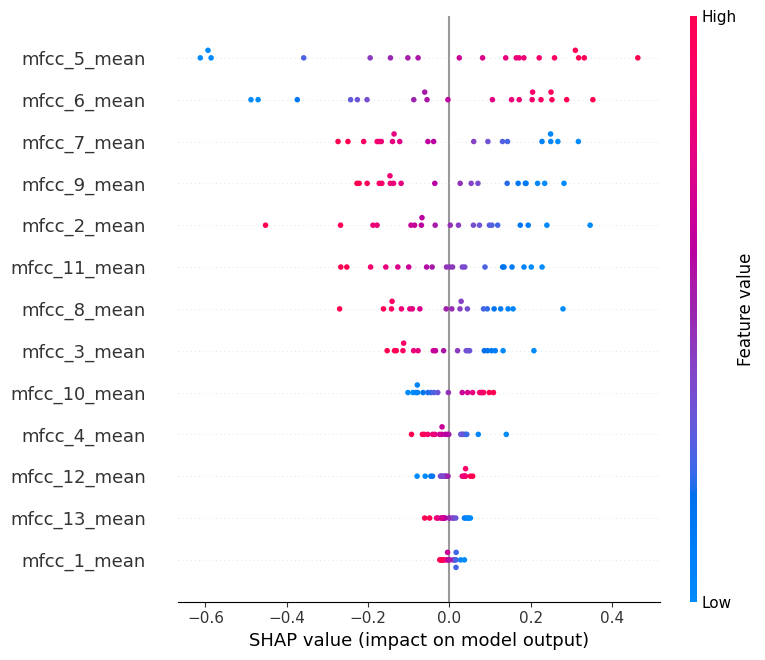

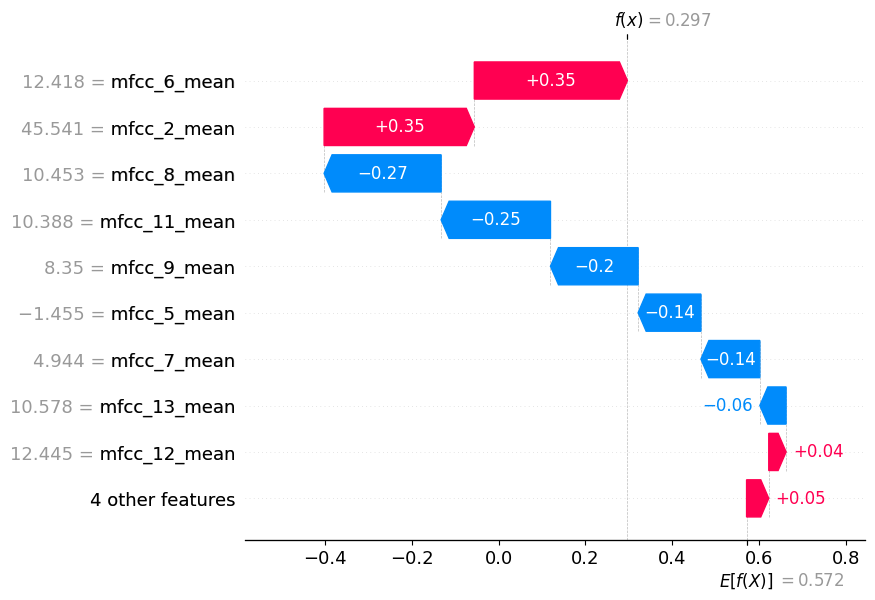

In [36]:
# crear el explainer
explainer_shap5 = shap.Explainer(model5.predict, X_mfccs)

# calcular SHAP values para todas las muestras
shap_values5 = explainer_shap5(X_mfccs)

# resumen global
shap.summary_plot(shap_values5, X_mfccs)

# explicación de la primera muestra
shap.plots.waterfall(shap_values5[instancia_a_explicar])

LIME

In [37]:
explainer_lime5 = LimeTabularExplainer(
    X_mfccs.values,
    feature_names = X_mfccs.columns,
    mode = "regression"
)

exp_lime = explainer_lime5.explain_instance(
    X_mfccs.iloc[instancia_a_explicar].values,
    model5.predict
)

exp_lime.show_in_notebook()

X does not have valid feature names, but Ridge was fitted with feature names


Agregación del SHAP de los 5 modelos

In [38]:
def shap_importance(shap_values, feature_names):
    importance = np.abs(shap_values.values).mean(axis=0)
    return pd.Series(importance, index=feature_names)

In [39]:
imp_energy = shap_importance(shap_values1, X_energia.columns)
imp_spectral = shap_importance(shap_values2, X_espectrales.columns)
imp_pitch = shap_importance(shap_values3, X_pitch.columns)
imp_formant = shap_importance(shap_values4, X_formants.columns)
imp_mfcc = shap_importance(shap_values5, X_mfccs.columns)

In [40]:
all_importances = pd.concat([
    imp_energy,
    imp_spectral,
    imp_pitch,
    imp_formant,
    imp_mfcc
], axis=1)

all_importances = all_importances.fillna(0)

In [41]:
importance_final_shap = all_importances.mean(axis=1)

importance_final_shap = importance_final_shap.sort_values(ascending=False)

print(importance_final_shap)

spectral_centroid     0.056178
mfcc_5_mean           0.053379
mfcc_6_mean           0.044206
spectral_rolloff      0.043516
f3_mean               0.040215
f1_mean               0.036831
mfcc_7_mean           0.034805
mfcc_9_mean           0.031442
spectral_bandwidth    0.030683
mfcc_2_mean           0.028716
mfcc_11_mean          0.024010
mfcc_8_mean           0.022021
mfcc_3_mean           0.017937
mfcc_10_mean          0.013196
pitch_std             0.010774
mfcc_4_mean           0.008487
mfcc_12_mean          0.006650
hnr                   0.006238
mfcc_13_mean          0.005196
pitch_mean            0.003274
mfcc_1_mean           0.003024
kurtosis              0.002278
f2_mean               0.001738
silence_ratio         0.000806
spectral_flatness     0.000484
skewness              0.000215
zcr                   0.000090
rms                   0.000007
dtype: float64


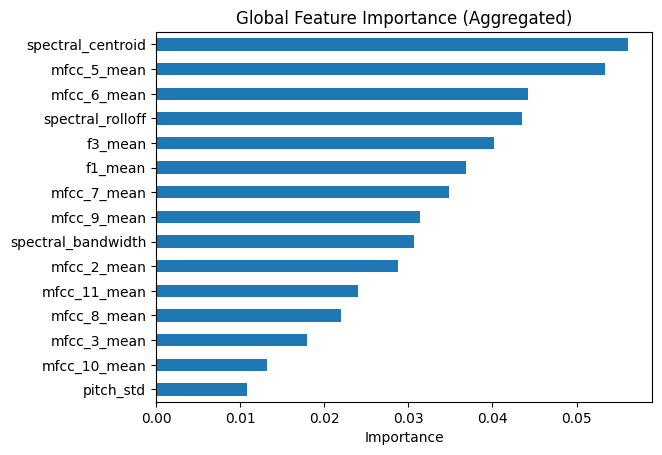

In [42]:
importance_final_shap.head(15).plot.barh()
plt.gca().invert_yaxis()
plt.title("Global Feature Importance (Aggregated)")
plt.xlabel("Importance")
plt.show()

Agregación del LIME de los 5 modelos

In [43]:
def sacar_importancias(X, model, explainer):

    importances = []

    for i in range(len(X)):

        exp = explainer.explain_instance(
            X.iloc[i].values,
            model.predict,
            num_features=len(X.columns)
        )

        weights = {}

        for feature, weight in exp.as_list():

            # quedarnos solo con el nombre de la feature
            feature_completa = re.split(r'[<>]=?', feature)
            feature_name = ""
            for name in feature_completa:
                if re.match(r'^[A-Za-z_0-9]+$', name.strip()):
                    feature_name = name.strip()

            # acumular pesos si aparece más de una vez
            weights[feature_name] = weights.get(feature_name, 0) + abs(weight)

        importances.append(weights)

    return importances

In [44]:
lime_importances_energy = sacar_importancias(X_energia,model1,explainer_lime1)
lime_importances_spectral = sacar_importancias(X_espectrales,model2,explainer_lime2)
lime_importances_pitch = sacar_importancias(X_pitch,model3,explainer_lime3)
lime_importances_formants = sacar_importancias(X_formants,model4,explainer_lime4)
lime_importances_mfcc = sacar_importancias(X_mfccs,model5,explainer_lime5)

X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names
X does not have valid feature names, but Ridge was fitted with feature names

In [45]:
print(lime_importances_mfcc)

[{'mfcc_5_mean': 0.46940794203999237, 'mfcc_6_mean': 0.3697998525185433, 'mfcc_9_mean': 0.2798159278093869, 'mfcc_11_mean': 0.25122800500899733, 'mfcc_8_mean': 0.22501157481319026, 'mfcc_3_mean': 0.1687483202810649, 'mfcc_7_mean': 0.1458465319797811, 'mfcc_4_mean': 0.100899818148746, 'mfcc_2_mean': 0.08601591470158607, 'mfcc_10_mean': 0.06695577822310675, 'mfcc_13_mean': 0.04484441483581178, 'mfcc_12_mean': 0.03563363247103722, 'mfcc_1_mean': 0.03549933441451291}, {'mfcc_5_mean': 0.569586594368299, 'mfcc_7_mean': 0.345996693663045, 'mfcc_9_mean': 0.3149258994181393, 'mfcc_11_mean': 0.2288688132968847, 'mfcc_6_mean': 0.11318428691421051, 'mfcc_4_mean': 0.10388161413978318, 'mfcc_2_mean': 0.0860869578486988, 'mfcc_8_mean': 0.07482580366305706, 'mfcc_13_mean': 0.05503700288289851, 'mfcc_3_mean': 0.04310937267104199, 'mfcc_10_mean': 0.04033863909364805, 'mfcc_1_mean': 0.031838591628796487, 'mfcc_12_mean': 0.018314208577834508}, {'mfcc_6_mean': 0.3703952690493822, 'mfcc_2_mean': 0.304708055

In [46]:
lime_energy_df = pd.DataFrame(lime_importances_energy)
lime_energy_df = lime_energy_df.fillna(0)

lime_spectral_df = pd.DataFrame(lime_importances_spectral)
lime_spectral_df = lime_spectral_df.fillna(0)

lime_pitch_df = pd.DataFrame(lime_importances_pitch)
lime_pitch_df = lime_pitch_df.fillna(0)

lime_formants_df = pd.DataFrame(lime_importances_formants)
lime_formants_df = lime_formants_df.fillna(0)

lime_mfcc_df = pd.DataFrame(lime_importances_mfcc)
lime_mfcc_df = lime_mfcc_df.fillna(0)

In [47]:
importance_energy = lime_energy_df.abs().mean().sort_values(ascending=False)
importance_spectral = lime_spectral_df.abs().mean().sort_values(ascending=False)
importance_pitch = lime_pitch_df.abs().mean().sort_values(ascending=False)
importance_formants = lime_formants_df.abs().mean().sort_values(ascending=False)
importance_mfcc = lime_mfcc_df.abs().mean().sort_values(ascending=False)

In [48]:
all_importances = pd.concat([
    importance_energy,
    importance_spectral,
    importance_pitch,
    importance_formants,
    importance_mfcc
])

importance_final_lime = all_importances.sort_values(ascending=False)
importance_final_lime

spectral_centroid     0.367945
mfcc_5_mean           0.331195
spectral_rolloff      0.293646
mfcc_6_mean           0.289526
f3_mean               0.259600
f1_mean               0.234978
mfcc_7_mean           0.216994
mfcc_9_mean           0.203544
spectral_bandwidth    0.197313
mfcc_2_mean           0.194896
mfcc_11_mean          0.161627
mfcc_8_mean           0.152966
mfcc_3_mean           0.116487
mfcc_10_mean          0.085318
pitch_std             0.070451
mfcc_4_mean           0.064277
mfcc_12_mean          0.042935
hnr                   0.042361
mfcc_13_mean          0.038016
mfcc_1_mean           0.022679
pitch_mean            0.021294
f2_mean               0.015066
kurtosis              0.014566
spectral_flatness     0.008983
silence_ratio         0.005234
skewness              0.001535
zcr                   0.000770
rms                   0.000298
dtype: float64

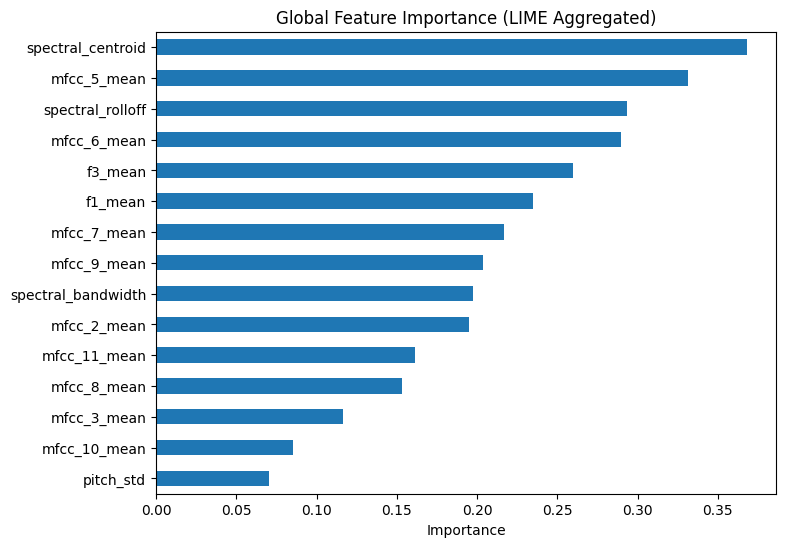

In [49]:
plt.figure(figsize=(8,6))

importance_final_lime.head(15).plot.barh()

plt.gca().invert_yaxis()
plt.xlabel("Importance")
plt.title("Global Feature Importance (LIME Aggregated)")

plt.show()

GRÁFICA COMBINADA SHAP-LIME

In [50]:
print(importance_final_lime)

spectral_centroid     0.367945
mfcc_5_mean           0.331195
spectral_rolloff      0.293646
mfcc_6_mean           0.289526
f3_mean               0.259600
f1_mean               0.234978
mfcc_7_mean           0.216994
mfcc_9_mean           0.203544
spectral_bandwidth    0.197313
mfcc_2_mean           0.194896
mfcc_11_mean          0.161627
mfcc_8_mean           0.152966
mfcc_3_mean           0.116487
mfcc_10_mean          0.085318
pitch_std             0.070451
mfcc_4_mean           0.064277
mfcc_12_mean          0.042935
hnr                   0.042361
mfcc_13_mean          0.038016
mfcc_1_mean           0.022679
pitch_mean            0.021294
f2_mean               0.015066
kurtosis              0.014566
spectral_flatness     0.008983
silence_ratio         0.005234
skewness              0.001535
zcr                   0.000770
rms                   0.000298
dtype: float64


In [51]:
print(importance_final_shap)

spectral_centroid     0.056178
mfcc_5_mean           0.053379
mfcc_6_mean           0.044206
spectral_rolloff      0.043516
f3_mean               0.040215
f1_mean               0.036831
mfcc_7_mean           0.034805
mfcc_9_mean           0.031442
spectral_bandwidth    0.030683
mfcc_2_mean           0.028716
mfcc_11_mean          0.024010
mfcc_8_mean           0.022021
mfcc_3_mean           0.017937
mfcc_10_mean          0.013196
pitch_std             0.010774
mfcc_4_mean           0.008487
mfcc_12_mean          0.006650
hnr                   0.006238
mfcc_13_mean          0.005196
pitch_mean            0.003274
mfcc_1_mean           0.003024
kurtosis              0.002278
f2_mean               0.001738
silence_ratio         0.000806
spectral_flatness     0.000484
skewness              0.000215
zcr                   0.000090
rms                   0.000007
dtype: float64


In [52]:
importancia_caracteristicas = (importance_final_lime + importance_final_shap) / 2
importancia_caracteristicas = importancia_caracteristicas.sort_values(ascending=False)

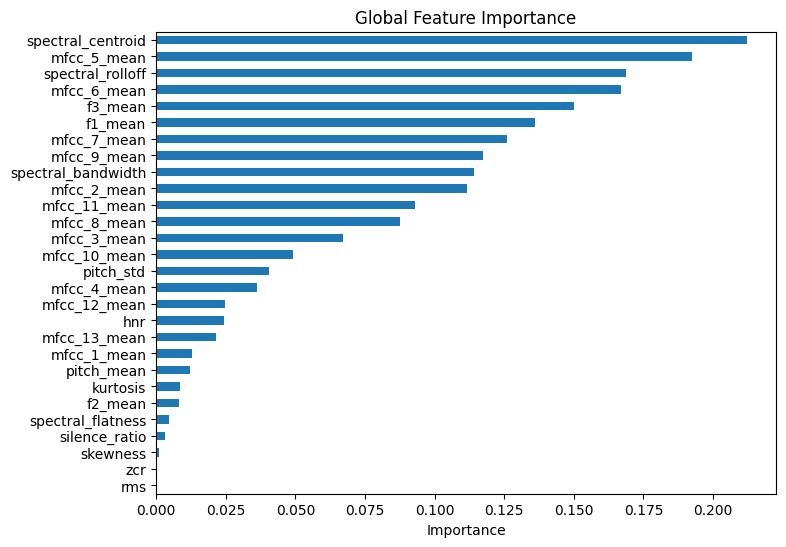

In [53]:
plt.figure(figsize=(8,6))

importancia_caracteristicas.plot.barh()

plt.gca().invert_yaxis()
plt.xlabel("Importance")
plt.title("Global Feature Importance")

plt.show()

EXTRAER ESPECTROGRAMAS DE MEL DE LOS AUDIOS DEL CONJUNTO

In [54]:
def extract_spectrogram(audio_path, sr=22050, n_mels=64):
    
    y, sr = librosa.load(audio_path, sr=sr)

    spectrogram = librosa.feature.melspectrogram(
        y=y,    
        sr=sr,
        n_mels=n_mels
    )

    spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)

    return spectrogram_db

In [55]:
def espectrogramas(df):

    specs = []

    for path in tqdm(df["filename"]):
            spec = extract_spectrogram(path)
            specs.append(spec)

    df["espectrograma_mel"] = specs

    return df

In [56]:
espectrogramas(audios_con_caracteristicas)

100%|██████████| 20/20 [00:00<00:00, 63.15it/s]


,filename,duration,rms,zcr,spectral_centroid,spectral_bandwidth,spectral_rolloff,spectral_flatness,pitch,pitch_mean,...,mfcc_11,mfcc_11_mean,mfcc_12,mfcc_12_mean,mfcc_13,mfcc_13_mean,skewness,kurtosis,score,espectrograma_mel
0,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,3.222313,0.030286,0.082993,1220.238428,1485.001296,2092.435025,0.012329,"[180.77186920887385, 230.40470702053787, 227.7...",140.456921,...,"[6.629158973693848, 9.057300567626953, 11.8049...",5.465416,"[7.588621139526367, 8.539609909057617, 10.7429...",0.746309,"[5.569737911224365, 8.072713851928711, 10.0387...",3.310118,-0.176774,20.654382,0.340131,"[[-30.771553, -30.697224, -32.958572, -36.0469..."
1,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,4.052625,0.058279,0.118364,1528.888178,1372.660614,2789.985236,0.113100,"[226.44649206156825, 222.55627686642293, 214.9...",227.455357,...,"[6.764190673828125, 7.092689514160156, 6.21548...",-8.449245,"[5.784214496612549, 6.138700485229492, 5.56312...",2.159155,"[4.819998741149902, 5.193569660186768, 4.90787...",-5.481335,-0.067163,6.119023,0.773167,"[[-60.960762, -60.476917, -63.279213, -62.7352..."
2,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,2.264813,0.019565,0.097704,1636.524177,1590.950084,2916.263204,0.034622,"[216.22053167995523, 212.505992363466, 213.737...",266.192884,...,"[9.953776359558105, 12.275445938110352, 15.311...",10.387823,"[8.524991989135742, 11.135714530944824, 14.328...",12.444645,"[7.669149875640869, 10.319452285766602, 13.415...",10.578391,-0.494815,28.548738,0.290588,"[[-32.293266, -27.455101, -27.605404, -28.5062..."
3,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,2.680250,0.031762,0.087269,1338.559837,1574.622223,2434.895833,0.020644,"[78.68552628393921, 65.40639132514966, 65.4063...",103.543593,...,"[6.925372123718262, 10.293638229370117, 15.419...",4.413110,"[6.873477935791016, 9.988012313842773, 13.7620...",11.852226,"[5.860315799713135, 8.713350296020508, 12.7352...",3.761299,-0.192651,32.359003,0.767834,"[[-31.209755, -30.359913, -29.800043, -29.0978..."
4,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,2.949688,0.049648,0.127200,1611.584397,1406.748976,2839.213710,0.157366,"[254.17759331190004, 212.505992363466, 211.282...",184.339778,...,"[9.518965721130371, 10.447029113769531, 10.602...",-0.758919,"[7.934693813323975, 8.346522331237793, 8.21642...",-8.807648,"[6.378042221069336, 6.328439712524414, 5.94116...",-0.098312,0.080189,5.308511,0.772510,"[[-54.580402, -51.472404, -49.28961, -48.34549..."
5,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,3.193500,0.031378,0.079297,1200.569031,1285.278799,2081.484375,0.142570,"[65.40639132514966, 65.40639132514966, 65.4063...",110.280558,...,"[15.753896713256836, 16.47547149658203, 14.844...",0.183326,"[13.769128799438477, 14.567262649536133, 13.33...",10.684436,"[11.926055908203125, 12.853876113891602, 12.19...",4.334969,0.305203,18.009800,0.664930,"[[-37.853607, -30.962343, -31.90303, -32.80784..."
6,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,2.376000,0.059970,0.077845,1201.308550,1252.548134,2384.375000,0.012188,"[100.87044475251382, 100.28947374140385, 99.71...",137.521780,...,"[7.512204647064209, 9.054068565368652, 8.47665...",-5.550871,"[9.062427520751953, 10.098169326782227, 7.3545...",-0.534284,"[9.721985816955566, 10.262840270996094, 6.2280...",-0.987136,-0.888580,4.122931,0.300437,"[[-63.13307, -60.574974, -59.21312, -60.72837,..."
7,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,2.568062,0.057325,0.075786,1284.090979,1437.619372,2780.189043,0.015401,"[111.27813843321147, 106.252996181733, 103.826...",103.169456,...,"[9.659843444824219, 9.710714340209961, 10.1489...",10.964149,"[8.283394813537598, 8.203035354614258, 8.62981...",-5.819136,"[6.909145355224609, 6.7088623046875, 7.1144104...",-5.744158,-0.589878,4.065627,0.267054,"[[-57.616245, -56.043957, -58.045963, -53.5743..."
8,c:\Users\ivire\Documents\GitHub\TFG\tfg-2526-x...,3.042562,0.048594,0.066966,1047.294232,1053.587620,2068.929036,0.157650,"

In [57]:
def build_surrogate():

    inputs = tf.keras.Input(shape=(8,128,1))

    x = layers.Conv2D(4, (3,3), activation="relu", name="conv")(inputs)
    x = layers.GlobalAveragePooling2D()(x)

    outputs = layers.Dense(1, activation="sigmoid")(x)

    model = tf.keras.Model(inputs, outputs)

    model.compile(
        optimizer="adam",
        loss="mse"
    )

    return model

In [58]:
def agrupar_bandas(spec, n_grupos=8):
    """
    spec: espectrograma (mel_bins, time)
    devuelve: espectrograma con menos bandas
    """

    mel_bins, time = spec.shape
    tam_grupo = mel_bins // n_grupos

    bandas = []

    for i in range(n_grupos):
        inicio = i * tam_grupo
        fin = (i + 1) * tam_grupo

        banda = spec[inicio:fin, :].mean(axis=0)
        bandas.append(banda)

    return np.array(bandas)

In [59]:
model_espectrogramas = build_surrogate()

X = audios_con_caracteristicas["espectrograma_mel"]

TARGET_TIME = 128

def fix_spec(spec):

    spec = spec[:64, :TARGET_TIME]

    if spec.shape[1] < TARGET_TIME:
        pad = TARGET_TIME - spec.shape[1]
        spec = np.pad(spec, ((0,0),(0,pad)))

    return spec

X = np.stack(audios_con_caracteristicas["espectrograma_mel"].apply(fix_spec).apply(agrupar_bandas).values)
X = (X - X.mean()) / (X.std() + 1e-8)
X = X[..., np.newaxis]

In [60]:
X_tensor = tf.convert_to_tensor(X, dtype=tf.float32)

y = out_dataset["score"].values
y_tensor = tf.convert_to_tensor(y, dtype=tf.float32)

In [61]:
model_espectrogramas.fit(X_tensor,y_tensor,epochs=50,batch_size=4,verbose=0)

SHAP

In [62]:
X_np = X_tensor.numpy()

background = X_np[:5]

explainer_SHAP_espectrogramas = shap.DeepExplainer(model_espectrogramas, background)
shap_values_espectrogramas = explainer_SHAP_espectrogramas.shap_values(X_np)

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


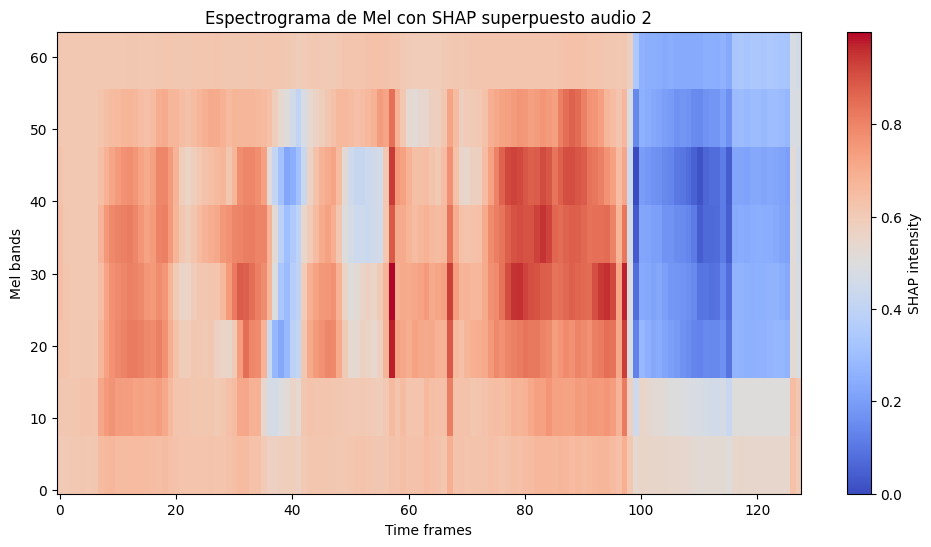

In [63]:
# Espectrograma original de Mel (64x128)
mel_spec = fix_spec(audios_con_caracteristicas["espectrograma_mel"].iloc[instancia_a_explicar])

# SHAP values para las 8 bandas (8x128)
# shap_values[0] porque tu modelo tiene 1 salida
shap_vals = shap_values_espectrogramas[0][instancia_a_explicar,...,0]  # shape: (8,128)

n_mels, n_frames = mel_spec.shape
n_superbands = shap_vals.shape[0]

# Interpolamos SHAP para que coincida con n_mels
shap_heatmap = np.zeros_like(mel_spec)
band_height = n_mels // n_superbands

for i in range(n_superbands):
    f = interp1d(np.arange(shap_vals.shape[1]), shap_vals[i], kind='linear', fill_value="extrapolate")
    band_values = f(np.arange(n_frames))
    start = i * band_height
    end = (i + 1) * band_height if i < n_superbands-1 else n_mels
    shap_heatmap[start:end, :] = np.tile(band_values, (end-start, 1))

# Normalizamos SHAP para visualización
shap_heatmap_norm = (shap_heatmap - shap_heatmap.min()) / (shap_heatmap.max() - shap_heatmap.min() + 1e-8)

# Plot
plt.figure(figsize=(12,6))
plt.imshow(mel_spec, aspect='auto', origin='lower', cmap='magma')
plt.imshow(shap_heatmap_norm, aspect='auto', origin='lower', cmap='coolwarm', alpha=1)
plt.colorbar(label='SHAP intensity')
plt.xlabel('Time frames')
plt.ylabel('Mel bands')
plt.title('Espectrograma de Mel con SHAP superpuesto audio ' + str(instancia_a_explicar))
plt.show()

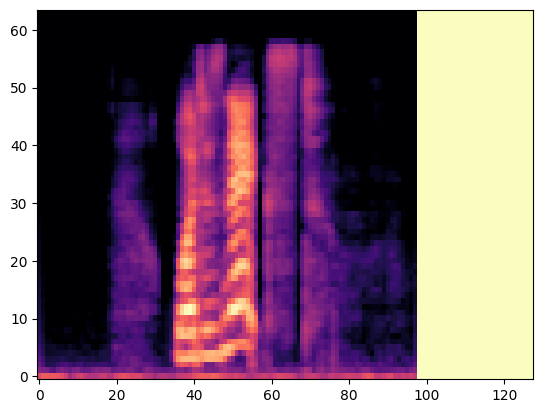

In [64]:
plt.imshow(mel_spec, aspect='auto', origin='lower', cmap='magma')

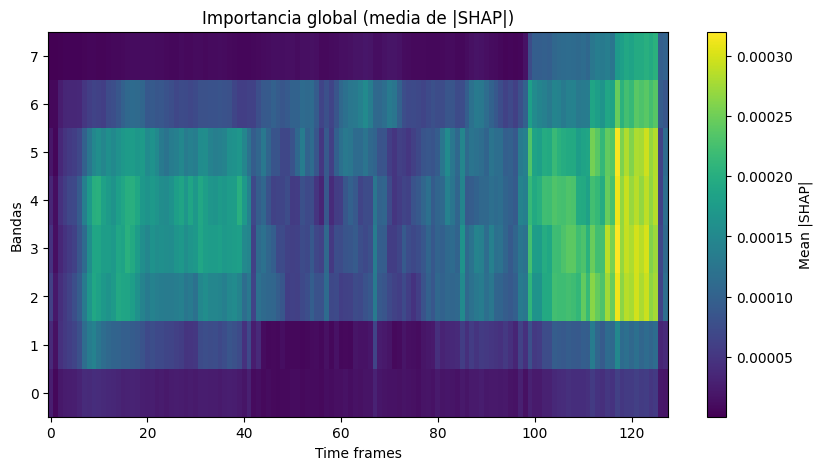

In [65]:
# shap_values shape: (N, H, W) o similar

shap_vals = shap_values_espectrogramas[0]  # (N, 8, 128) o (N, H, W)

# Importancia global
global_shap = np.mean(np.abs(shap_vals), axis=0)  # (H, W)

plt.figure(figsize=(10,5))
plt.imshow(global_shap, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Mean |SHAP|')
plt.title('Importancia global (media de |SHAP|)')
plt.xlabel('Time frames')
plt.ylabel('Bandas')
plt.show()

LIME

In [66]:
def predict_fn_lime_flat(x_flat):
    """
    x_flat: shape (batch, 1024)
    Convierte a (batch, 8, 128, 1) antes de pasar al modelo
    """
    x_reshaped = x_flat.reshape(-1, 8, 128, 1)
    preds = model_espectrogramas.predict(x_reshaped)
    return preds  # regresión: shape (batch, 1)

In [67]:
# Flatten de todo el dataset para LIME
X_flat = X_np[...,0].reshape(X_np.shape[0], -1)  # (n_samples, 1024)
x_sample = X_flat[instancia_a_explicar]

explainer_tab = lime_tabular.LimeTabularExplainer(
    X_flat,
    feature_names=[f"band{i}_t{t}" for i in range(8) for t in range(128)],
    class_names=["score"],
    mode="regression"
)

exp_lime = explainer_tab.explain_instance(
    x_sample,
    predict_fn_lime_flat,
    num_features=64
)

157/157 [==============================] - 0s 2ms/step


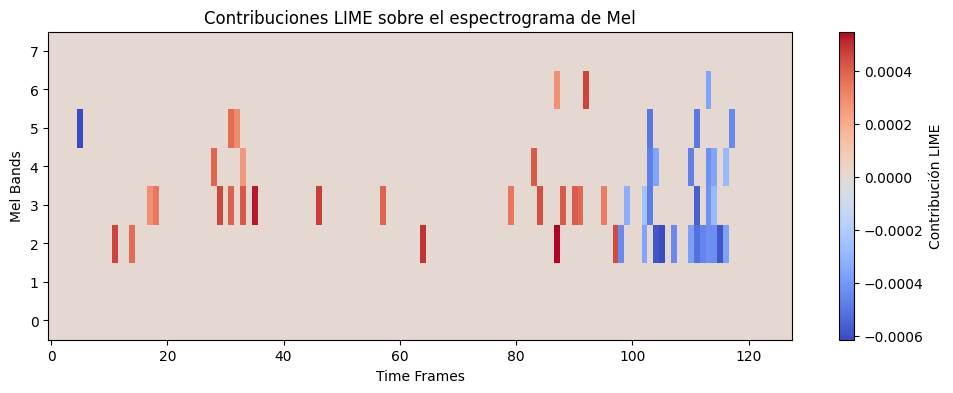

In [68]:
# Obtener los pesos de LIME
feature_list = exp_lime.as_list()  # [('band0_t0 <= 0.1', 0.12), ...]

weights_matrix = np.zeros((8, 128))

for feature_name, weight in feature_list:
    # extraer indices de band y tiempo usando regex
    match = re.match(r'band(\d+)_t(\d+)', feature_name)
    if match:
        i = int(match.group(1))
        t = int(match.group(2))
        weights_matrix[i, t] = weight
    # si no coincide, lo ignoramos (puede ser un feature truncado)
    
# Graficar heatmap
plt.figure(figsize=(12, 4))
plt.imshow(weights_matrix, aspect='auto', origin='lower', cmap='coolwarm')
plt.colorbar(label='Contribución LIME')
plt.xlabel('Time Frames')
plt.ylabel('Mel Bands')
plt.title('Contribuciones LIME sobre el espectrograma de Mel')
plt.show()

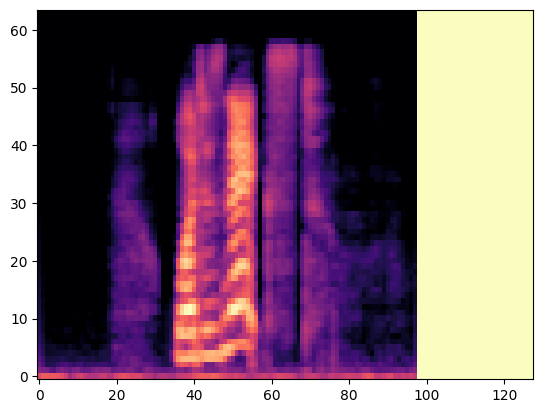

In [69]:
plt.imshow(mel_spec, aspect='auto', origin='lower', cmap='magma')

In [70]:
# Flatten dataset
X_flat = X_np[..., 0].reshape(X_np.shape[0], -1)

# Inicializar explainer UNA sola vez
explainer_tab = lime_tabular.LimeTabularExplainer(
    X_flat,
    feature_names=[f"band{i}_t{t}" for i in range(8) for t in range(128)],
    class_names=["score"],
    mode="regression"
)

# Acumulador global
global_lime = np.zeros((8, 128))

# Número de muestras para estimar global
n_samples_global = min(100, len(X_flat))

indices = np.random.choice(len(X_flat), n_samples_global, replace=False)

for idx in tqdm(indices):
    x_sample = X_flat[idx]

    exp_lime = explainer_tab.explain_instance(
        x_sample,
        predict_fn_lime_flat,
        num_features=64
    )

    weights_matrix = np.zeros((8, 128))

    for feature_name, weight in exp_lime.as_list():
        match = re.match(r'band(\d+)_t(\d+)', feature_name)
        if match:
            i = int(match.group(1))
            t = int(match.group(2))
            weights_matrix[i, t] = weight

    # acumulamos importancia absoluta
    global_lime += np.abs(weights_matrix)

# promedio
global_lime /= n_samples_global

  0%|          | 0/20 [00:00<?, ?it/s]

157/157 [==============================] - 0s 2ms/step


  5%|▌         | 1/20 [00:03<01:12,  3.82s/it]

157/157 [==============================] - 1s 3ms/step


 10%|█         | 2/20 [00:07<01:07,  3.74s/it]

157/157 [==============================] - 0s 2ms/step


 15%|█▌        | 3/20 [00:11<01:03,  3.74s/it]

157/157 [==============================] - 0s 3ms/step


 20%|██        | 4/20 [00:15<01:00,  3.76s/it]

157/157 [==============================] - 0s 2ms/step


 25%|██▌       | 5/20 [00:18<00:55,  3.68s/it]

157/157 [==============================] - 0s 2ms/step


 30%|███       | 6/20 [00:22<00:51,  3.71s/it]

157/157 [==============================] - 0s 3ms/step


 35%|███▌      | 7/20 [00:26<00:49,  3.82s/it]

157/157 [==============================] - 0s 2ms/step


 40%|████      | 8/20 [00:29<00:44,  3.74s/it]

157/157 [==============================] - 0s 2ms/step


 45%|████▌     | 9/20 [00:33<00:40,  3.71s/it]

157/157 [==============================] - 0s 2ms/step


 50%|█████     | 10/20 [00:37<00:36,  3.67s/it]

157/157 [==============================] - 1s 3ms/step


 55%|█████▌    | 11/20 [00:40<00:33,  3.68s/it]

157/157 [==============================] - 0s 2ms/step


 60%|██████    | 12/20 [00:44<00:29,  3.70s/it]

157/157 [==============================] - 0s 2ms/step


 65%|██████▌   | 13/20 [00:48<00:25,  3.67s/it]

157/157 [==============================] - 0s 2ms/step


 70%|███████   | 14/20 [00:51<00:21,  3.61s/it]

157/157 [==============================] - 0s 2ms/step


 75%|███████▌  | 15/20 [00:55<00:18,  3.70s/it]

157/157 [==============================] - 0s 2ms/step


 80%|████████  | 16/20 [00:59<00:14,  3.71s/it]

157/157 [==============================] - 0s 2ms/step


 85%|████████▌ | 17/20 [01:02<00:11,  3.68s/it]

157/157 [==============================] - 0s 2ms/step


 90%|█████████ | 18/20 [01:06<00:07,  3.62s/it]

157/157 [==============================] - 0s 3ms/step


 95%|█████████▌| 19/20 [01:10<00:03,  3.62s/it]

157/157 [==============================] - 0s 2ms/step


100%|██████████| 20/20 [01:13<00:00,  3.70s/it]


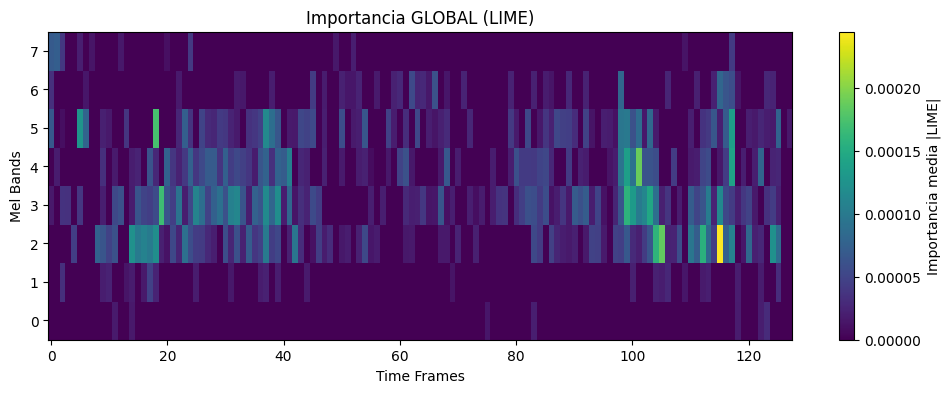

In [71]:
plt.figure(figsize=(12, 4))
plt.imshow(global_lime, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Importancia media |LIME|')
plt.xlabel('Time Frames')
plt.ylabel('Mel Bands')
plt.title('Importancia GLOBAL (LIME)')
plt.show()

INTEGRATED GRADIENTS

In [72]:
def integrated_gradients(model, x, baseline=None, steps=50):

    x = tf.cast(x, tf.float32)

    if baseline is None:
        baseline = tf.zeros_like(x)

    # generar interpolaciones
    alphas = tf.linspace(0.0, 1.0, steps+1)

    gradients = []

    for alpha in alphas:
        x_step = baseline + alpha * (x - baseline)

        with tf.GradientTape() as tape:
            tape.watch(x_step)
            pred = model(tf.expand_dims(x_step, axis=0), training=False)

        grad = tape.gradient(pred, x_step)
        gradients.append(grad)

    gradients = tf.stack(gradients)

    # promedio de gradientes
    avg_gradients = tf.reduce_mean(gradients[:-1], axis=0)

    # integrated gradients
    integrated_grads = (x - baseline) * avg_gradients

    return integrated_grads.numpy()

In [73]:
x_audio = X_np[instancia_a_explicar]  # primer audio

ig = integrated_gradients(model_espectrogramas, x_audio, steps=100)

# quitar canal
ig = ig[:,:,0]

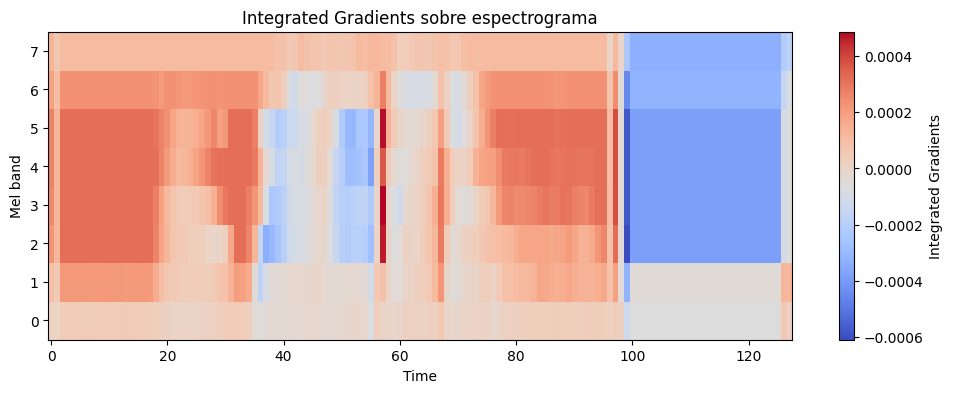

In [74]:
spectrogram = x_audio[:,:,0]

plt.figure(figsize=(12,4))

plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="magma")
plt.imshow(ig, aspect="auto", origin="lower", cmap="coolwarm", alpha=1)

plt.colorbar(label="Integrated Gradients")
plt.title("Integrated Gradients sobre espectrograma")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

- rojo: Aumenta la predicción del modelo
- azul: reduce la predicción del modelo

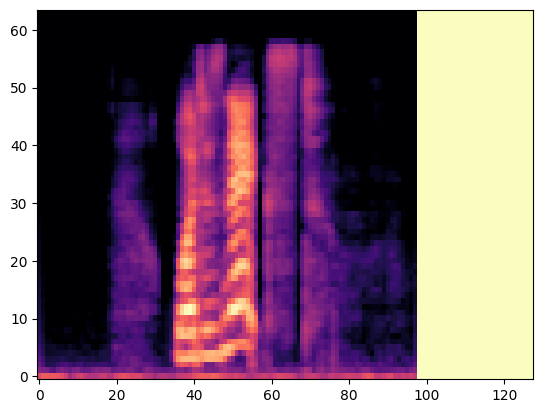

In [75]:
plt.imshow(mel_spec, aspect='auto', origin='lower', cmap='magma')

In [76]:
global_ig = np.zeros_like(X_np[0][:,:,0])

n_samples_global = min(100, len(X_np))
indices = np.random.choice(len(X_np), n_samples_global, replace=False)

for idx in tqdm(indices):
    x_audio = X_np[idx]

    ig = integrated_gradients(
        model_espectrogramas,
        x_audio,
        steps=100
    )

    ig = ig[:, :, 0]

    global_ig += np.abs(ig)

global_ig /= n_samples_global

100%|██████████| 20/20 [00:29<00:00,  1.47s/it]


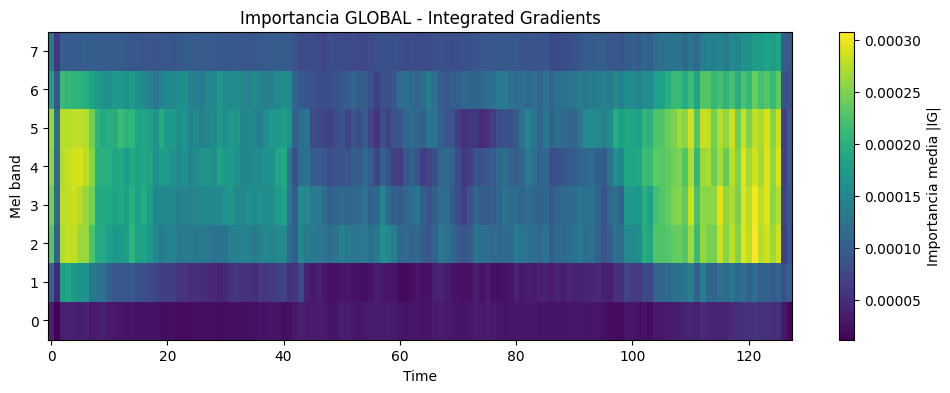

In [77]:
plt.figure(figsize=(12,4))

plt.imshow(
    global_ig,
    aspect="auto",
    origin="lower",
    cmap="viridis"
)

plt.colorbar(label="Importancia media |IG|")
plt.title("Importancia GLOBAL - Integrated Gradients")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

GRAD CAM

In [78]:
def gradcam(model, img, last_conv_layer_name):

    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    img = tf.expand_dims(img, axis=0)

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img)
        loss = predictions[:, 0]  # regresión

    grads = tape.gradient(loss, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))

    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    heatmap = tf.maximum(heatmap, 0)

    heatmap /= tf.reduce_max(heatmap) + 1e-8

    return heatmap.numpy()

In [79]:
model_espectrogramas.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 8, 128, 1)]       0         
                                                                 
 conv (Conv2D)               (None, 6, 126, 4)         40        
                                                                 
 global_average_pooling2d (  (None, 4)                 0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1)                 5         
                                                                 
Total params: 45 (180.00 Byte)
Trainable params: 45 (180.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [80]:
x_audio = X_np[instancia_a_explicar]

heatmap = gradcam(
    model_espectrogramas,
    x_audio,
    last_conv_layer_name="conv"
)

In [81]:
heatmap_resized = tf.image.resize(
    heatmap[..., np.newaxis],
    (8,128)
).numpy().squeeze()

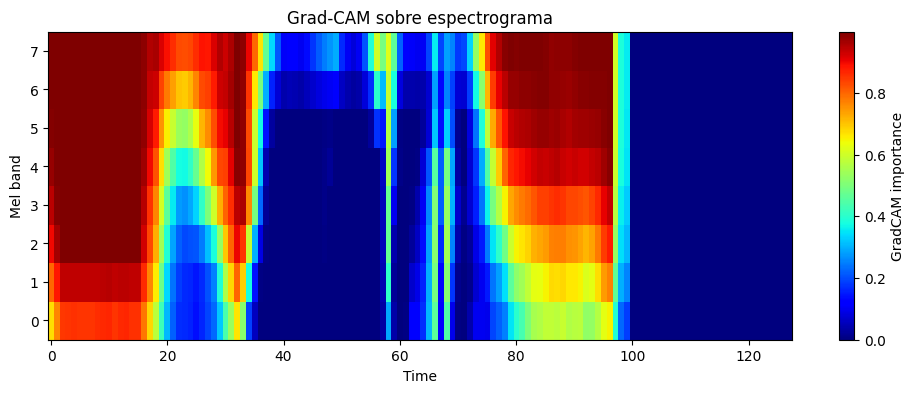

In [82]:
spectrogram = x_audio[:,:,0]

plt.figure(figsize=(12,4))

plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="magma")
plt.imshow(heatmap_resized, aspect="auto", origin="lower", cmap="jet", alpha=1)

plt.colorbar(label="GradCAM importance")

plt.title("Grad-CAM sobre espectrograma")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

- Azul: Poca o nula influencia en la predicción del modelo
- Amarillo/Naranja: Influencia media en la predicción
- Rojo: Influencia alta en la predicción

In [83]:
global_gradcam = np.zeros((8, 128))  # tamaño final

# número de muestras
n_samples_global = min(100, len(X_np))
indices = np.random.choice(len(X_np), n_samples_global, replace=False)

for idx in tqdm(indices):
    x_audio = X_np[idx]

    heatmap = gradcam(
        model_espectrogramas,
        x_audio,
        last_conv_layer_name="conv"  # tu capa
    )

    # redimensionar al tamaño del espectrograma
    heatmap_resized = tf.image.resize(
        heatmap[..., np.newaxis],
        (8, 128)
    ).numpy().squeeze()

    # acumular
    global_gradcam += heatmap_resized

# promedio
global_gradcam /= n_samples_global

100%|██████████| 20/20 [00:01<00:00, 15.79it/s]


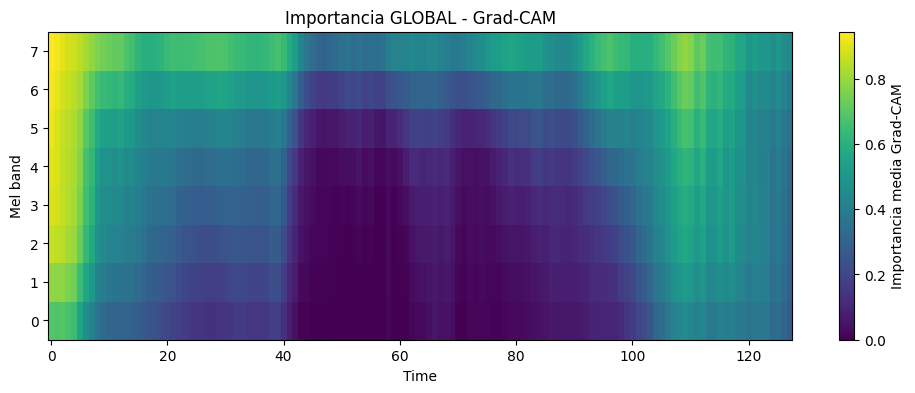

In [84]:
plt.figure(figsize=(12,4))

plt.imshow(
    global_gradcam,
    aspect="auto",
    origin="lower",
    cmap="viridis"
)

plt.colorbar(label="Importancia media Grad-CAM")
plt.title("Importancia GLOBAL - Grad-CAM")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

Comparación SHAP VS LIME VS IG VS GRAD CAM

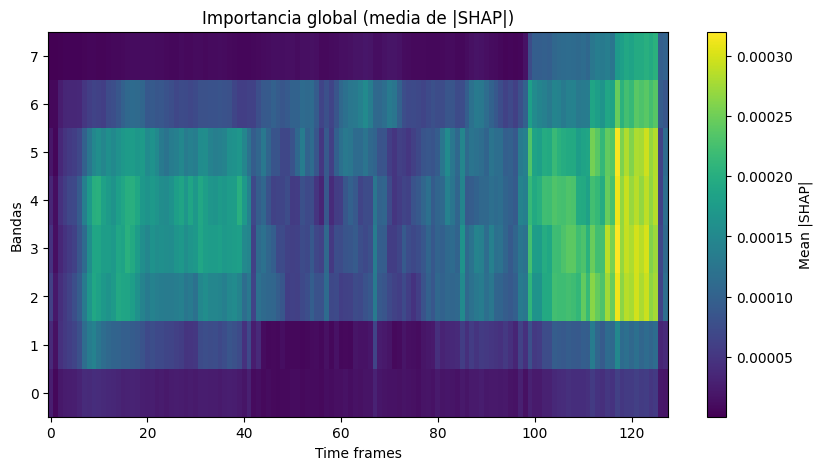

In [85]:
# shap_values shape: (N, H, W) o similar

shap_vals = shap_values_espectrogramas[0]  # (N, 8, 128) o (N, H, W)

# Importancia global
global_shap = np.mean(np.abs(shap_vals), axis=0)  # (H, W)

plt.figure(figsize=(10,5))
plt.imshow(global_shap, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Mean |SHAP|')
plt.title('Importancia global (media de |SHAP|)')
plt.xlabel('Time frames')
plt.ylabel('Bandas')
plt.show()

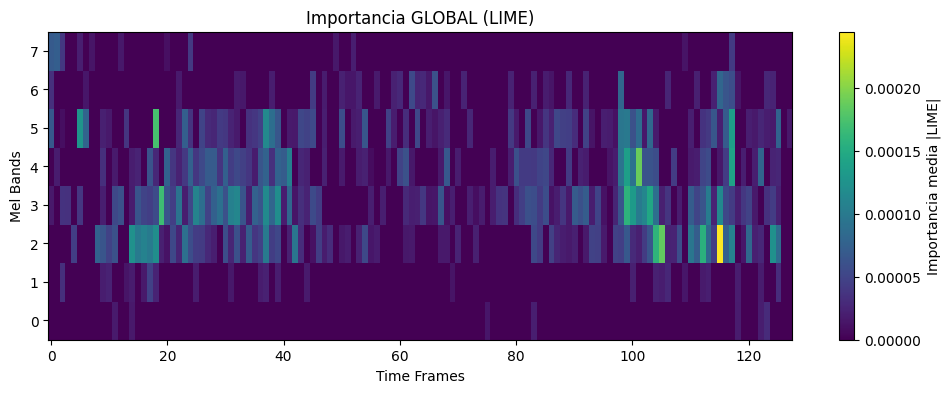

In [86]:
plt.figure(figsize=(12, 4))
plt.imshow(global_lime, aspect='auto', origin='lower', cmap='viridis')
plt.colorbar(label='Importancia media |LIME|')
plt.xlabel('Time Frames')
plt.ylabel('Mel Bands')
plt.title('Importancia GLOBAL (LIME)')
plt.show()

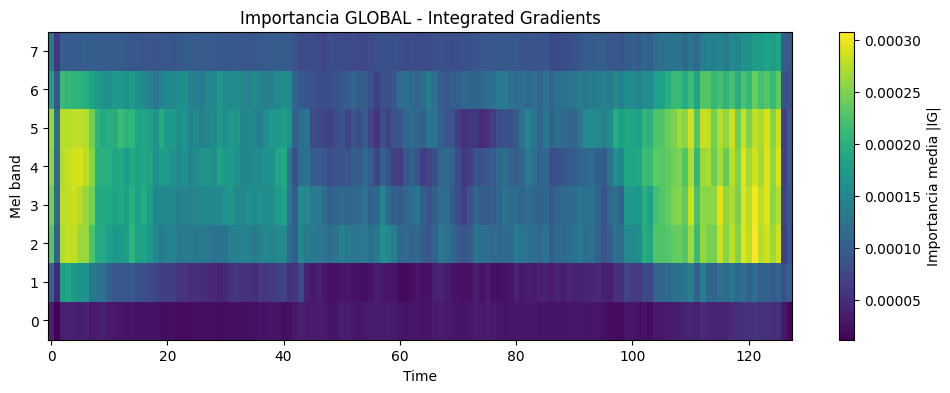

In [87]:
plt.figure(figsize=(12,4))

plt.imshow(
    global_ig,
    aspect="auto",
    origin="lower",
    cmap="viridis"
)

plt.colorbar(label="Importancia media |IG|")
plt.title("Importancia GLOBAL - Integrated Gradients")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

GRAD CAM

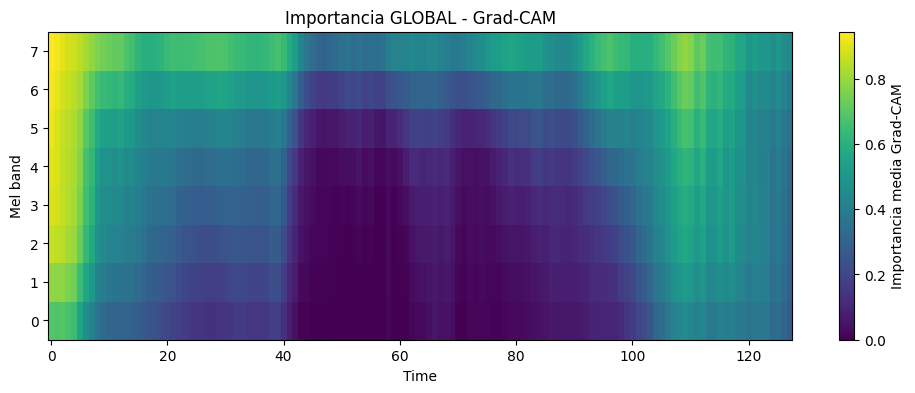

In [88]:
plt.figure(figsize=(12,4))

plt.imshow(
    global_gradcam,
    aspect="auto",
    origin="lower",
    cmap="viridis"
)

plt.colorbar(label="Importancia media Grad-CAM")
plt.title("Importancia GLOBAL - Grad-CAM")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()

COMBINACIÓN DE LAS 4

In [89]:
def normalize(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

global_shap = np.squeeze(global_shap)

shap_n = normalize(global_shap)
lime_n = normalize(global_lime)
ig_n = normalize(global_ig)
gradcam_n = normalize(global_gradcam)

In [90]:
combined = (shap_n + lime_n + ig_n + gradcam_n) / 4

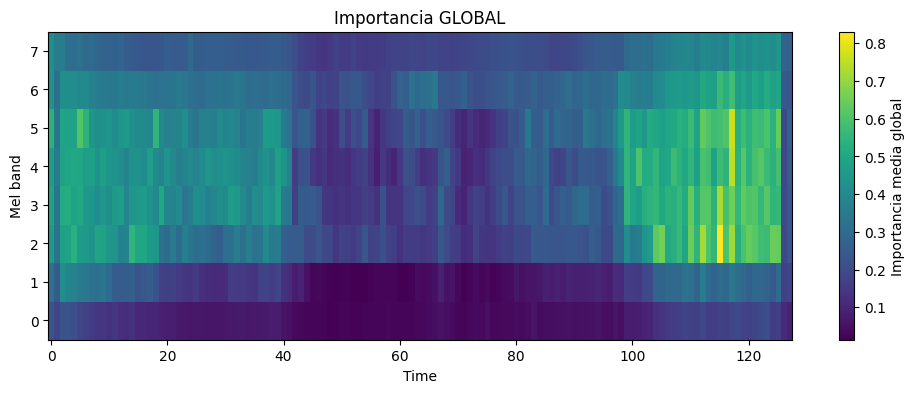

In [91]:
plt.figure(figsize=(12,4))

plt.imshow(
    combined,
    aspect="auto",
    origin="lower",
    cmap="viridis"
)

plt.colorbar(label="Importancia media global")
plt.title("Importancia GLOBAL")
plt.xlabel("Time")
plt.ylabel("Mel band")

plt.show()